In [1]:
import pickle, importlib, re, h5py, os, itertools, json, logging
from collections import defaultdict
from pathlib import Path
from tqdm.auto import tqdm
import numpy as np, pandas as pd
from sklearn.preprocessing import minmax_scale, StandardScaler, MinMaxScaler
from sklearn.neighbors import NearestNeighbors, KNeighborsRegressor, KernelDensity
from sklearn.decomposition import PCA
from scipy.stats import spearmanr, pearsonr
from scipy.spatial import ConvexHull
from scipy.sparse import csr_matrix, coo_matrix, save_npz
from statsmodels.stats.multitest import multipletests
from anndata import AnnData
import scanpy as sc
from umap import UMAP
from matplotlib import pyplot as plt
import seaborn as sns
# %config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.facecolor']='white'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

from util import config_logger
logger = config_logger(logging.getLogger(__name__))

In [2]:
path2figdir = Path('/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper')

In [3]:
def reload_all():
    import util, backend, analysis, analysis2
    importlib.reload(util)
    importlib.reload(backend)
    importlib.reload(analysis)
    importlib.reload(analysis2)

reload_all()

In [4]:
with open('color_map_mBC.json', 'r') as f:
    color_map = json.load(f)

In [5]:
from backend import load_gene_annotation, get_gene_scores
df_gene_anno = load_gene_annotation(version='mm10').set_index('gene_name')
df_gene_anno = df_gene_anno[~df_gene_anno.index.duplicated(keep=False)]

In [6]:
from backend import load_chrom_size
chrom_sizes = load_chrom_size()
# chrom_sizes = {k.split('_')[1]: v for k, v in chrom_sizes.items() if k.startswith('mm10')}
chrom_sizes

{'hg38_chr1': 248956422,
 'hg38_chr2': 242193529,
 'hg38_chr3': 198295559,
 'hg38_chr4': 190214555,
 'hg38_chr5': 181538259,
 'hg38_chr6': 170805979,
 'hg38_chr7': 159345973,
 'hg38_chrX': 156040895,
 'hg38_chr8': 145138636,
 'hg38_chr9': 138394717,
 'hg38_chr11': 135086622,
 'hg38_chr10': 133797422,
 'hg38_chr12': 133275309,
 'hg38_chr13': 114364328,
 'hg38_chr14': 107043718,
 'hg38_chr15': 101991189,
 'hg38_chr16': 90338345,
 'hg38_chr17': 83257441,
 'hg38_chr18': 80373285,
 'hg38_chr20': 64444167,
 'hg38_chr19': 58617616,
 'hg38_chrY': 57227415,
 'hg38_chr22': 50818468,
 'hg38_chr21': 46709983,
 'hg38_chrM': 16569,
 'mm10_chr1': 195471971,
 'mm10_chr2': 182113224,
 'mm10_chrX': 171031299,
 'mm10_chr3': 160039680,
 'mm10_chr4': 156508116,
 'mm10_chr5': 151834684,
 'mm10_chr6': 149736546,
 'mm10_chr7': 145441459,
 'mm10_chr10': 130694993,
 'mm10_chr8': 129401213,
 'mm10_chr14': 124902244,
 'mm10_chr9': 124595110,
 'mm10_chr11': 122082543,
 'mm10_chr13': 120421639,
 'mm10_chr12': 12012

# Load GAGE-seq

In [7]:
lib_name, species = 'mBC', 'mm10'
walk_policy = 'complete'
# walk_policy = 'linear'
# walk_policy = 'wowalk'
res_str = '500kb'
# res_str = '200kb'

path2root = Path('/work/magroup/tianming/Researches/sc-hic/data2/final')

adata = sc.read_10x_mtx(
    path2root / 'results' / f'RNA_{lib_name}_{walk_policy}_{species}_filtered_10x',
#     var_names='gene_ids',
)
cell_id_all = np.loadtxt(path2root / 'results' / f'RNA_{lib_name}_{walk_policy}_{species}_filtered_10x' / 'barcodes.tsv', dtype=object)
adata.obs.index = cell_id_all
with open(path2root / 'results' / f'meta_{lib_name}_{walk_policy}_{species}_filtered.pkl', 'rb') as f:
    df_meta = pickle.load(f)
adata.obs = pd.concat([adata.obs, df_meta], axis=1)
del df_meta
print(adata.shape)

df_seurat = pd.read_csv(path2root / 'results' / 'meta-Seurat_mBC_complete_mm10_filtered.csv', index_col=0)
adata = adata[df_seurat.index].copy()
adata.obs['cell type'] = pd.Categorical(df_seurat['Idents.obj.'], categories=[
    "L2 IT RvPP", "L2/3 IT RSP", "L2/3 IT CTX a", "L2/3 IT CTX b", "L2/3 IT CTX c",
    "L4 IT CTX", "L4/5 IT CTX", "L5 IT RSP", "L5 IT CTX", "L6 IT CTX",
    "L5 PT CTX", "L6 CT CTX a", "L6 CT CTX b", "L5/6 NP CTX", "L6b CTX",
    "Pvalb a", "Pvalb b", "Sst a", "Sst b", "Vip", "Sncg", "Lamp5", "Meis2",
    "Astro", "OPC", "ODC", "VLMC", "Micro",
    "Unk",
])
print(adata.shape)

adata_rna_raw = adata.copy()

sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()
sc.pp.scale(adata, max_value=10)
adata_rna = adata
del adata

(4454, 26419)
(3296, 26419)


In [8]:
path2root = Path(f'/work/magroup/tianming/Researches/sc-hic/data2/final/results/mBC_complete_mm10_filtered')
score_dict_raw = {}
for score_name, res_str, res in tqdm([
    ('is-hw5', '100kb', 1e5),
    ('is-hw10', '100kb', 1e5),
    ('is-hw5', '200kb', 2e5),
    ('ab', '100kb', 1e5),
    ('ab', '200kb', 2e5),
    ('ab', '250kb', 2.5e5),
    ('ab', '500kb', 5e5),
    ('genebody', '100kb', 1e5),
    ('genebody', '200kb', 2e5),
    ('genebody', '250kb', 2.5e5),
    ('genebody', '500kb', 5e5),
]):
    with open(path2root / f'score-{res_str}-{score_name}.pkl', 'rb') as f:
        score_dict = pickle.load(f)
    score_dict = {key.split('_')[1]: value for key, value in score_dict.items()}
    mask = np.isin(cell_id_all, adata_rna.obs.index)
    assert np.all(cell_id_all[mask] == adata_rna.obs.index)
    score_dict = {key: value[mask] for key, value in score_dict.items()}
    score_dict_raw[score_name, res_str] = score_dict
    del score_name, res_str, res, score_dict

  0%|          | 0/11 [00:00<?, ?it/s]

In [10]:
reload_all()
from backend import Library

path2dir = Path('/work/magroup/tianming/Researches/sc-hic/data2/final')
suffix = f'mBC_complete_mm10_filtered'
res, res_str = int(1e5), '100kb'
# res, res_str = int(1e4), '10kb'
obj = Library('none', 'none', 'mBC', path2dir, wellid_list=path2dir / 'results' / f'meta_{suffix}.pkl')
obj.load_DNA(path2dir / 'results' / suffix / f'contact_{res_str}.pkl')
obj.load_meta(path2dir / 'results' / f'meta_{suffix}.pkl')
obj.subset(obj.meta.index.isin(adata_rna.obs.index))

2023-10-31 23:36:23:INFO:Loading /work/magroup/tianming/Researches/sc-hic/data2/final/results/meta_mBC_complete_mm10_filtered.pkl
2023-10-31 23:36:23:INFO:# of cells: 4454
2023-10-31 23:36:23:INFO:Loading /work/magroup/tianming/Researches/sc-hic/data2/final/results/mBC_complete_mm10_filtered/contact_100kb.pkl
2023-10-31 23:38:42:INFO:Loaded 22 chroms and 478129837 contacts
2023-10-31 23:38:42:INFO:Loading /work/magroup/tianming/Researches/sc-hic/data2/final/results/meta_mBC_complete_mm10_filtered.pkl
2023-10-31 23:39:08:INFO:Keeping columns `['DNA species' 'RNA species' 'species']`


# Load MerFISH

In [11]:
path2dir = Path('/work/magroup/tianming/Researches/scRNAseq_data/Zhang2021BICCN')
adata_zhang2021 = AnnData(pd.read_csv(path2dir / 'counts.csv', index_col=0))
adata_zhang2021.obs = pd.read_csv(path2dir / 'cell_labelsx.csv', index_col=0)
adata_zhang2021.obs['class_label'] = pd.Categorical(adata_zhang2021.obs['class_label'], categories=['GABAergic', 'Glutamatergic', 'Other'])
adata_zhang2021.obs['subclass'] = pd.Categorical(adata_zhang2021.obs['subclass'], categories=[
    'L2/3 IT', 'L4/5 IT', 'L5 IT', 'L6 IT', 'L6 IT Car3',
    'L5/6 NP', 'L6 CT', 'L5 ET', 'L6b',
    'Lamp5', 'Pvalb', 'Sncg', 'Sst', 'Vip',
    'Astro', 'Endo', 'Micro', 'OPC', 'Oligo', 'PVM', 'Peri', 'VLMC', 'SMC',
    'other'])
adata_zhang2021.obs['label'] = pd.Categorical(adata_zhang2021.obs['label'], categories=np.unique(adata_zhang2021.obs['label']))
adata_zhang2021

AnnData object with n_obs × n_vars = 280186 × 254
    obs: 'sample_id', 'slice_id', 'class_label', 'subclass', 'label'

In [12]:
path2dir = Path('/work/magroup/tianming/Researches/scRNAseq_data/Zhang2021BICCN')
path2file = path2dir / 'coordinates.csv'
print(path2file)
with open(path2file, 'rb') as f:
    df_coor = pickle.load(f)
adata_zhang2021.obs[['coor_X', 'coor_Y']] = df_coor.loc[adata_zhang2021.obs.index]

/work/magroup/tianming/Researches/scRNAseq_data/Zhang2021BICCN/coordinates.csv


In [14]:
df_fitness = []
for slice_id, df in adata_zhang2021.obs.groupby('slice_id'):
    x = df.loc[df['subclass'] == 'L2/3 IT', ['coor_X', 'coor_Y']].values
    df_fitness.append({'slice_id': slice_id, 'explained_variance_ratio': PCA().fit(x).explained_variance_ratio_[0]})
df_fitness = pd.DataFrame(df_fitness).set_index('slice_id').sort_values('explained_variance_ratio')
df_fitness

,explained_variance_ratio
slice_id,
mouse2_slice20,0.751321
mouse1_slice170,0.882703
mouse1_slice21,0.892324
mouse2_slice40,0.896811
mouse1_slice122,0.897515
...,...
mouse2_slice189,0.978734
mouse1_slice201,0.979515
mouse2_slice169,0.982153


  0%|          | 0/64 [00:00<?, ?it/s]

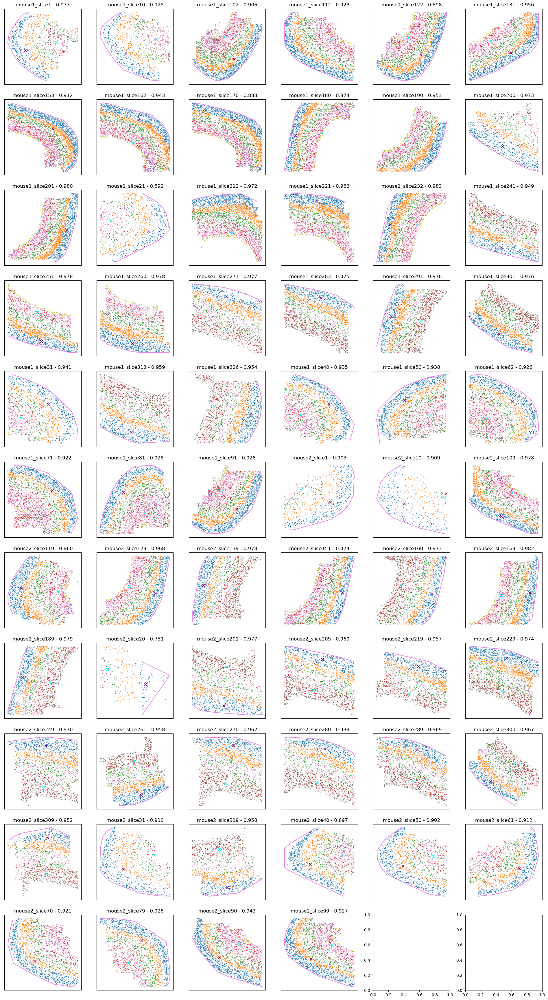

  0%|          | 0/64 [00:00<?, ?it/s]

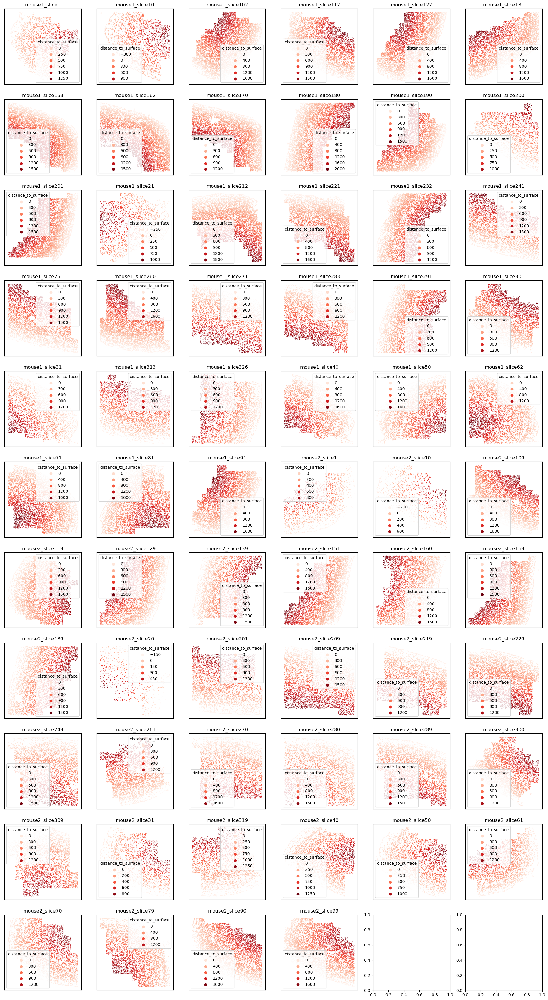

In [15]:
# %%time
nplot = len(set(adata_zhang2021.obs['slice_id']))
ncol = 6
nrow = int(np.ceil(nplot / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
distance_to_surface_list = []
for ax, (slice_id, df) in zip(axes.flat, tqdm(adata_zhang2021.obs.groupby('slice_id'))):
    df_plot = df[df['class_label'] == 'Glutamatergic'].copy()
    df_plot['subclass'] = df_plot['subclass'].cat.remove_unused_categories()
    sns.scatterplot(ax=ax, data=df_plot, x='coor_X', y='coor_Y', hue='subclass', s=3)
    ax.set(xlabel='', ylabel='', xticks=[], yticks=[])
    ax.legend().remove()
    
    x = df.loc[df['subclass'] == 'L2/3 IT', ['coor_X', 'coor_Y']].values
    explained_variance_ratio = float(df_fitness.loc[slice_id, 'explained_variance_ratio'])
    
    x_superficial = df.loc[df['subclass'].isin(['L2/3 IT']), ['coor_X', 'coor_Y']].mean().values
    x_deep = df.loc[df['subclass'].isin(['L6 IT', 'L5/6 NP', 'L6 CT']), ['coor_X', 'coor_Y']].mean().values
    if slice_id in ['mouse1_slice241', 'mouse2_slice209', 'mouse2_slice289', 'mouse2_slice261']:
        kk = .5
    elif explained_variance_ratio > .935:
        kk = 1.5
    else:
        kk= 20
    x_external = x_superficial + (x_superficial - x_deep) * kk
    ax.scatter(*list(x_superficial[:, None]), marker='x', c='purple')
    ax.scatter(*list(x_deep[:, None]), marker='x', c='cyan')
#     ax.scatter(*list(x_external[:, None]), marker='x', c='brown')
    
    x_all = df[['coor_X', 'coor_Y']].values
#     x_exc = df.loc[df['class_label'] == 'Glutamatergic', ['coor_X', 'coor_Y']].values
    x_exc = df.loc[df['subclass'] == 'L2/3 IT', ['coor_X', 'coor_Y']].values
    x_input = np.concatenate([x_external[None], x_exc], axis=0)
    hull = ConvexHull(x_input, qhull_options='QG0')
    
    distance = np.full(len(x_all), np.inf)
    for visible_facet in hull.simplices[hull.good]:
        ax.plot(*list(hull.points[visible_facet].T), color='violet')
        t = np.diff(hull.points[visible_facet], axis=0).ravel()
        p = hull.points[visible_facet[0]]
        d = np.cross(t, x_all - p) / np.linalg.norm(t) * np.sign(np.cross(t, x_deep - p))
        distance = np.minimum(distance, d)
        del visible_facet, t, d
    distance_to_surface_list.append(pd.Series(distance, index=df.index))
    
    ax.set(title=f'{slice_id} - {explained_variance_ratio:.3f}')
    
    del slice_id, df, x_superficial, x_deep, x_external, x_all, x_exc, x_input, hull, distance
plt.show()
plt.close('all')
distance_to_surface_list = pd.concat(distance_to_surface_list)
adata_zhang2021.obs['distance_to_surface'] = distance_to_surface_list.loc[adata_zhang2021.obs.index]

nplot = len(set(adata_zhang2021.obs['slice_id']))
ncol = 6
nrow = int(np.ceil(nplot / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
for ax, (slice_id, df) in zip(axes.flat, tqdm(adata_zhang2021.obs.groupby('slice_id'))):
    sns.scatterplot(ax=ax, data=df, x='coor_X', y='coor_Y', hue='distance_to_surface', s=3, palette='Reds')
    ax.set(title=slice_id, xlabel='', ylabel='', xticks=[], yticks=[])
plt.show()
plt.close('all')

In [16]:
adata_zhang2021.obs[['distance_to_surface']].to_csv(
    '/work/magroup/tianming/Researches/sc-hic/data2/final/results/depth_mBC.csv'
)

In [13]:
%%time
path2dir = Path('/work/magroup/tianming/Researches/sc-hic/data2/final/results_mBC_integration_Zhang2021BICCN')
PCA_int_dict = {}

def load(ndim, celltype_name, sample_name):
    path2file = path2dir / f'PCA-Seurat-ndim{ndim}-{celltype_name}-{sample_name}.csv'
    df_coor = pd.read_csv(path2file, index_col=0, header=0)
    PCA_int_dict[ndim, celltype_name, sample_name] = (
        df_coor.loc[ df_coor.index.str.startswith('X')].copy(),
        df_coor.loc[~df_coor.index.str.startswith('X')].copy(),
    )

for key, df in tqdm(adata_zhang2021.obs.groupby('slice_id')):
    load(10, 'exc', key)
    load(20, 'exc', key)

del load

  0%|          | 0/64 [00:00<?, ?it/s]

CPU times: user 5.18 s, sys: 164 ms, total: 5.34 s
Wall time: 31.8 s


In [14]:
adj_matrices = {}
for key, (x_zhang, x_gage) in tqdm(PCA_int_dict.items()):
    num_pcs = None
    adj = NearestNeighbors(n_neighbors=50)\
        .fit(x_gage.values[:, :num_pcs])\
        .kneighbors_graph(x_zhang.values[:, :num_pcs], mode='distance')
    adj_matrices[key] = adj
    del key, x_zhang, x_gage, num_pcs, adj

  0%|          | 0/128 [00:00<?, ?it/s]

In [ ]:
int_umap = {}
npc_int = 10
cell_subset_name = 'exc'
slice_id_list = ['mouse1_slice102', 'mouse1_slice122', 'mouse2_slice99']
for slice_id in tqdm(slice_id_list):
    latent_int_zhang2021, latent_int_gage = PCA_int_dict[npc_int, cell_subset_name, slice_id]
    dataset_name = ['Zhang et al. 2021'] * len(latent_int_zhang2021) + ['GAGE-seq'] * len(latent_int_gage)
    x = np.concatenate([latent_int_zhang2021.values, latent_int_gage.values], axis=0)
    x = UMAP(min_dist=.1, n_neighbors=40, random_state=0).fit_transform(x)
    int_umap[npc_int, cell_subset_name, slice_id] = pd.DataFrame(
        {'UMAP 1': x[:, 0], 'UMAP 2': x[:, 1], 'dataset': dataset_name},
        index=np.concatenate([latent_int_zhang2021.index.values, latent_int_gage.index.values])
    )

/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-umap.png
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-umap.pdf


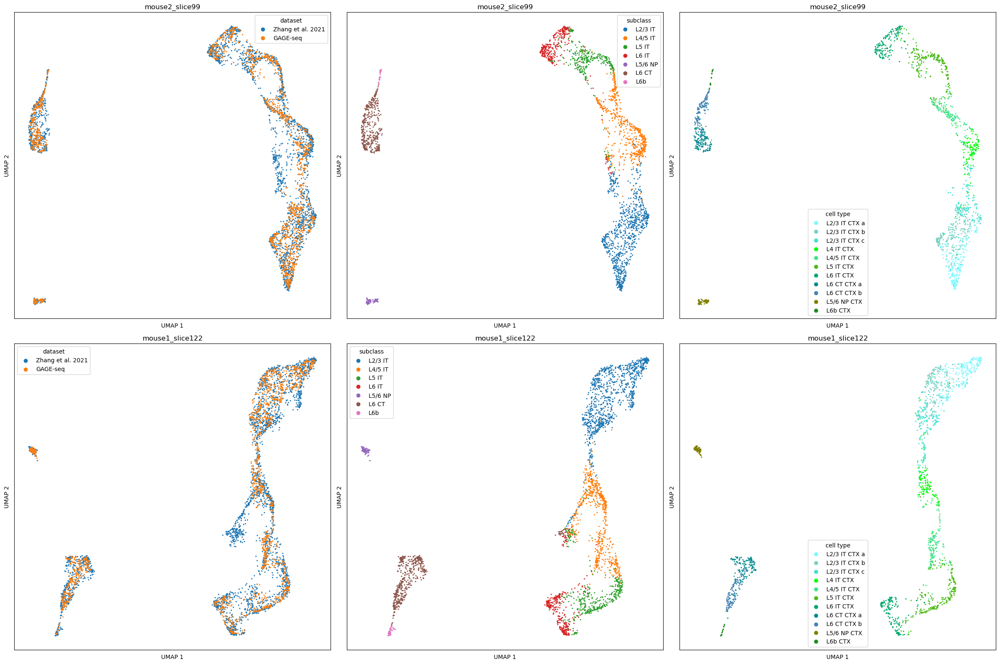

In [167]:
reload_all()
from analysis2 import get_gene_sets_by_cell_type_scanpy, calc_gene_set_overlap, \
    calc_rna_score, calc_dna_score
from util import save_fig

slice_id_list_plot = [
    'mouse2_slice99',
    'mouse1_slice122',
]
npc_int = 10
cell_subset_name = 'exc'

nrow, ncol = len(slice_id_list_plot), 3
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*8, nrow*8))
kwargs = dict(x='UMAP 1', y='UMAP 2', s=5, edgecolor='none')
for ax_row, slice_id in zip(axes, slice_id_list_plot):
    df = int_umap[npc_int, cell_subset_name, slice_id]
    
    ax = ax_row[0]
    sns.scatterplot(data=df, hue='dataset', ax=ax, **kwargs)

    ax = ax_row[1]
    t = df[df['dataset'].eq('Zhang et al. 2021')]
    hue = adata_zhang2021.obs['subclass']
    hue = hue[t.index].cat.remove_unused_categories()
    sns.scatterplot(data=t, hue=hue, ax=ax, **kwargs)

    ax = ax_row[2]
    t = df[df['dataset'].eq('GAGE-seq')]
    hue = adata_rna.obs['cell type']
    hue = hue[t.index].cat.remove_unused_categories()
    sns.scatterplot(data=t, hue=hue, ax=ax, **kwargs, palette=color_map)

    for ax in ax_row:
        ax.set(xlabel='UMAP 1', ylabel='UMAP 2', title=slice_id, xticks=[], yticks=[])

fig.tight_layout()
save_fig(path2figdir / f'spatial-umap')
plt.show()
plt.close('all')

In [163]:
knn_graph_int = {}
npc_int = 10
cell_subset_name = 'exc'
slice_id_list = ['mouse1_slice102', 'mouse1_slice122', 'mouse2_slice99']
num_pcs = None
for slice_id in tqdm(slice_id_list):
    latent_int_zhang2021, latent_int_gage = PCA_int_dict[npc_int, cell_subset_name, slice_id]
    dataset_name = ['Zhang et al. 2021'] * len(latent_int_zhang2021) + ['GAGE-seq'] * len(latent_int_gage)
    x = np.concatenate([latent_int_zhang2021.values, latent_int_gage.values], axis=0)
    x = NearestNeighbors(n_neighbors=20)\
        .fit(latent_int_gage.values[:, :num_pcs])\
        .kneighbors_graph(latent_int_zhang2021.values[:, :num_pcs], mode='distance')\
        .tocoo()
    df = pd.DataFrame(data={
        'GAGE-seq': adata_rna.obs.loc[latent_int_gage.index, 'cell type'].cat.remove_unused_categories().values[x.col],
        'MERFISH': adata_zhang2021.obs.loc[latent_int_zhang2021.index, 'subclass'].cat.remove_unused_categories().values[x.row],
#         'MERFISH': adata_zhang2021.obs.loc[latent_int_zhang2021.index, 'label'].cat.remove_unused_categories().values[x.row],
    })
    df = df.groupby(list(df.columns)).size().unstack()
    knn_graph_int[npc_int, cell_subset_name, slice_id] = df

  0%|          | 0/3 [00:00<?, ?it/s]

/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-knn-adj.png
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-knn-adj.pdf


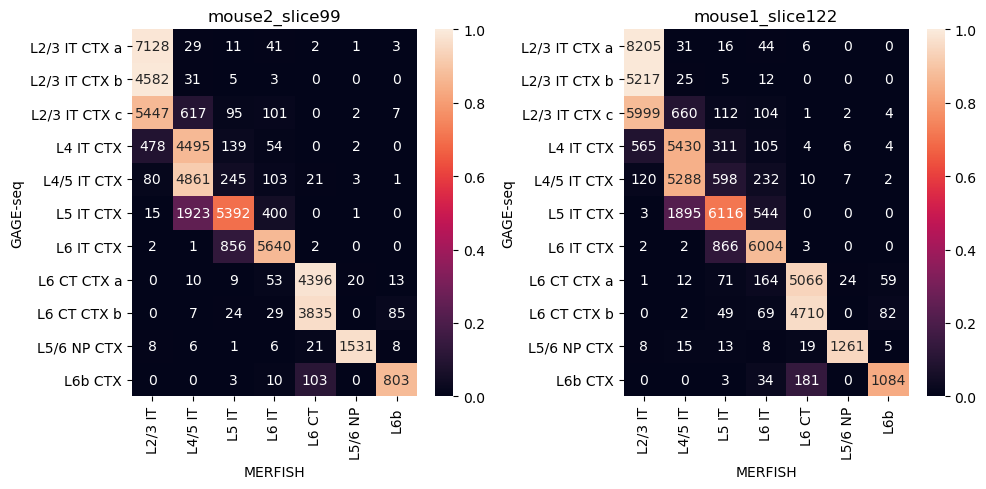

In [166]:
slice_id_list_plot = [
    'mouse2_slice99',
    'mouse1_slice122',
]
nrow, ncol = 1, len(slice_id_list_plot)
fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow), squeeze=False)
for ax, slice_id in zip(axes.flat, slice_id_list_plot):
    df = knn_graph_int[npc_int, cell_subset_name, slice_id]
    df = df[['L2/3 IT', 'L4/5 IT', 'L5 IT', 'L6 IT', 'L6 CT', 'L5/6 NP', 'L6b']]
    sns.heatmap(data=df.div(df.sum(1), 0), ax=ax, annot=df, fmt='d', vmin=0, vmax=1)
    ax.set(title=slice_id)
fig.tight_layout()
save_fig(path2figdir / f'spatial-knn-adj')
plt.show()
plt.close('all')

# call DEG

(1665, 26419)
(1665, 11003)


/work/magroup/tianming/anaconda3/envs/CARE-seq/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/work/magroup/tianming/anaconda3/envs/CARE-seq/lib/python3.8/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/work/magroup/tianming/anaconda3/envs/CARE-seq/lib/python3.8/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


(1665, 2008)


/work/magroup/tianming/anaconda3/envs/CARE-seq/lib/python3.8/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


L2/3 IT CTX a 347
L2/3 IT CTX b 253
L2/3 IT CTX c 60
L4 IT CTX 173
L4/5 IT CTX 224
L5 IT CTX 218
L6 IT CTX 205
L6 CT CTX a 181
L6 CT CTX b 251
L5/6 NP CTX 452
L6b CTX 979


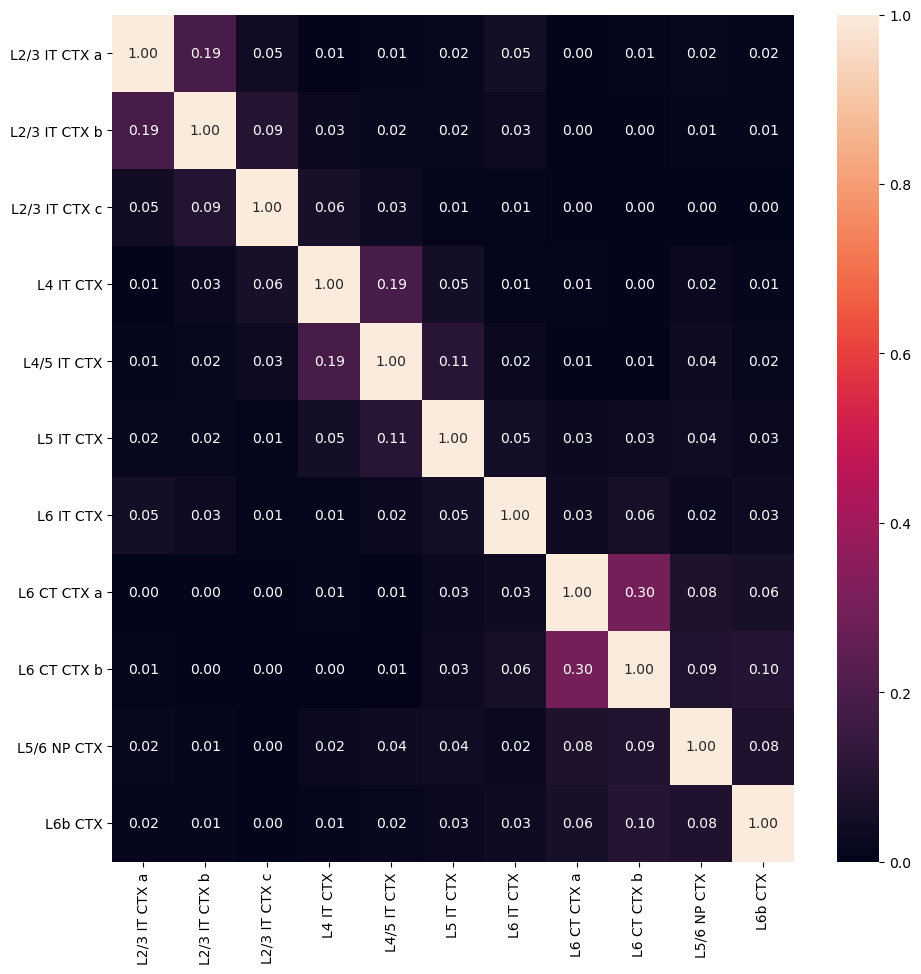

In [66]:
adata = adata_rna[adata_rna.obs['cell type'].isin([
    "L2/3 IT CTX a", "L2/3 IT CTX b", "L2/3 IT CTX c", "L4 IT CTX", "L4/5 IT CTX",
    "L5 IT CTX", "L6 IT CTX", "L6 CT CTX a", "L6 CT CTX b", "L5/6 NP CTX", "L6b CTX",
])].copy()
print(adata.shape)
sc.pp.filter_genes(adata, min_cells=30)
print(adata.shape)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
print(adata.shape)
sc.tl.rank_genes_groups(adata, 'cell type', method='wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1, min_in_group_fraction=.1, max_out_group_fraction=1.)

names = adata.uns['rank_genes_groups_filtered']['names']
marker_gene_sets_exc = {label: np.array([_ for _ in names[label] if isinstance(_, str)]) for label in names.dtype.names}
for k, v in marker_gene_sets_exc.items():
    print(k, len(v))

reload_all()
from analysis2 import calc_gene_set_overlap
calc_gene_set_overlap(marker_gene_sets_exc)

adata_exc = adata
del adata

# Visualize

transcriptome 218
transcriptome 218
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-dist2surface-line.png
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-dist2surface-line.pdf


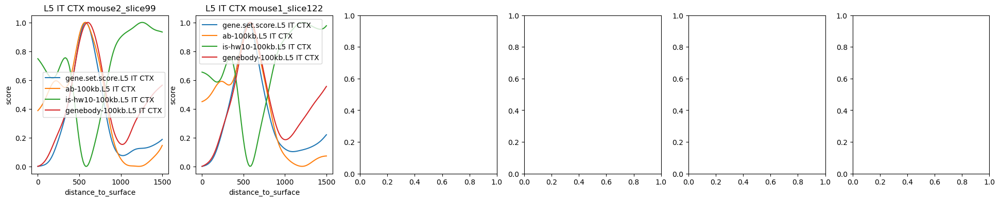

In [225]:
reload_all()
from analysis2 import get_gene_sets_by_cell_type_scanpy, calc_gene_set_overlap, \
    calc_rna_score, calc_dna_score, knn_dist2weight

# slice_id_list = np.unique(adata_zhang2021.obs['slice_id'])
# slice_id_list = ['mouse1_slice232']
slice_id_list = ['mouse2_slice99', 'mouse1_slice122']

adata_zhang2021

npc_int = 10
cell_subset_name = 'exc'

score_list = [
    ('gene.set.score', None, None),
    ('ab', '100kb', 1e5),
#     ('ab', '200kb', 2e5),
#     ('ab', '500kb', 5e5),
#     ('is-hw5', '100kb', 1e5),
    ('is-hw10', '100kb', 1e5),
#     ('is-hw5', '200kb', 2e5),
    ('genebody', '100kb', 1e5),
#     ('genebody', '200kb', 2e5),
]
score_dict = score_dict_raw

for score_name, res_str, res in score_list: 
    if score_name != 'gene.set.score' and (score_name, res_str) not in score_dict:
        print(f'({score_name}, {res_str}) not found')
score_list = [
    (score_name, res_str, res)
    for score_name, res_str, res in score_list
    if score_name == 'gene.set.score' or (score_name, res_str) in score_dict
]

marker_gene_sets = marker_gene_sets_exc
# gene_set_name = 'L2/3 IT CTX a'
gene_set_name = 'L5 IT CTX'
genes = marker_gene_sets[gene_set_name]

nplot = len(slice_id_list)
ncol = 6
nrow = int(np.ceil(nplot / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4), sharex=False)
for ax, slice_id in zip(axes.flat, slice_id_list):
    latent_int_zhang2021, latent_int_gage = PCA_int_dict[npc_int, cell_subset_name, slice_id]
    adata = adata_zhang2021[latent_int_zhang2021.index].copy()
    
    x = adata.obs['distance_to_surface'].values[:, None]
    if cell_subset_name == 'exc':
        mask = x.ravel() >= 0
#         xx = np.linspace(0, x.max(), 100)[:, None]
        xx = np.linspace(0, 1500, 100)[:, None]
    else:
        mask = np.ones(len(x), dtype=bool)
        xx = np.linspace(x.min(), x.max(), 100)[:, None]
    
    w = adj_matrices[npc_int, cell_subset_name, slice_id].copy()
    w = knn_dist2weight(w)
#     w = w.tocsr()
#     sigma = np.array([
#         np.quantile(w.data[l: r], .3)
#         for l, r in zip(w.indptr[:-1], w.indptr[1:])
#     ])
#     w = w.tocoo()
#     w.data[:] = np.exp(-np.square(w.data / sigma[w.row]))
#     w.data /= np.bincount(w.row, weights=w.data, minlength=w.shape[0])[w.row]
    
    for score_name, res_str, res in score_list:
        if score_name == 'gene.set.score':
            key = f'{score_name}.{gene_set_name}'
            s = calc_rna_score(adata_rna, genes)
        else:
            key = f'{score_name}-{res_str}.{gene_set_name}'
            score_by_chrom = score_dict[score_name, res_str]
            s = calc_dna_score(df_gene_anno, adata_rna, score_by_chrom, genes, res)
        s = s.mean(1)
        s = s[latent_int_gage.index].values
        s = np.asarray(w @ s).squeeze()
        adata.obs[key] = s
        
        y = adata.obs[key].values[mask]
        y = np.clip(y, *np.quantile(y, [.01, .99]))
        
        yy = KNeighborsRegressor(
            n_neighbors=len(y), weights=lambda d: np.exp(-np.square(d / 1e2)),
        ).fit(x[mask], y).predict(xx)
        
        yy = MinMaxScaler().fit_transform(yy[:, None]).squeeze(-1)
        
        ax.plot(xx, yy, label=key)

        del score_name, res_str, res, key, s, y, yy
    ax.set(xlabel='distance_to_surface', ylabel='score', title=f'{gene_set_name} {slice_id}')
    ax.legend()
    del ax
for suffix in ['png', 'pdf']:
    path2file = path2figdir / f'spatial-dist2surface-line.{suffix}'
    print(path2file)
    plt.savefig(path2file, dpi=600)
plt.show()
plt.close('all')
del x, xx

transcriptome 218
transcriptome 218
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-insitu.png
/work/magroup/tianming/Researches/sc-hic/data2/final/figures-mBC-paper/spatial-insitu.pdf


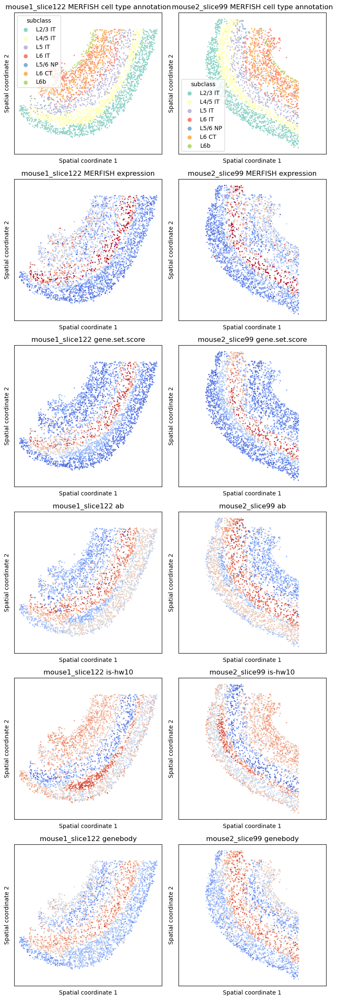

In [206]:
reload_all()
from analysis2 import get_gene_sets_by_cell_type_scanpy, calc_gene_set_overlap, \
    calc_rna_score, calc_dna_score
from util import save_fig

slice_id_list = np.unique(adata_zhang2021.obs['slice_id'])

adata_zhang2021

npc_int = 10
cell_subset_name = 'exc'

# -- scA/B, raw --
score_list = [
    ('gene.set.score', None, None),
    ('ab', '100kb', 1e5),
    ('is-hw10', '100kb', 1e5),
    ('genebody', '100kb', 1e5),
]
score_dict = score_dict_raw

for score_name, res_str, res in score_list: 
    if score_name != 'gene.set.score' and (score_name, res_str) not in score_dict:
        print(f'({score_name}, {res_str}) not found')
score_list = [
    (score_name, res_str, res)
    for score_name, res_str, res in score_list
    if score_name == 'gene.set.score' or (score_name, res_str) in score_dict
]

marker_gene_sets = marker_gene_sets_exc
# gene_set_name = 'L2/3 IT CTX a'
gene_set_name = 'L5 IT CTX'
genes = marker_gene_sets[gene_set_name]

slice_id_list_plot = [
    'mouse1_slice122',
    'mouse2_slice99',
]

# nrow, ncol = len(slice_id_list_plot), len(score_list) + 2
nrow, ncol = len(score_list) + 2, len(slice_id_list_plot)
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4), squeeze=False)
kwargs = dict(edgecolor='none', cmap='coolwarm', s=5, rasterized=True)
for ax_row, slice_id in zip(axes.T, slice_id_list_plot):
    latent_int_zhang2021, latent_int_gage = PCA_int_dict[npc_int, cell_subset_name, slice_id]
    adata = adata_zhang2021[latent_int_zhang2021.index].copy()

    ax = ax_row[0]
    t = kwargs.copy()
    del t['cmap']
    t['palette'] = 'Set3'
    sns.scatterplot(
        ax=ax, data=adata.obs, x='coor_X', y='coor_Y', hue='subclass', **t)
    
    ax = ax_row[1]
    s = np.asarray(adata[:, genes[np.isin(genes, adata.var.index)]].X)
    s = StandardScaler().fit_transform(s)
    s = s.mean(1)
    y = s
    y = np.clip(y, *np.quantile(y, [0, .95]))
    y = MinMaxScaler().fit_transform(y[:, None]).squeeze(-1)
    mappable = ax.scatter(*list(adata.obs[['coor_X', 'coor_Y']].values.T), c=y, **kwargs)
#     plt.colorbar(mappable, ax=ax, fraction=.1, shrink=.5, aspect=20, pad=.05)
    
    w = adj_matrices[npc_int, cell_subset_name, slice_id].copy()
    w = knn_dist2weight(w)
    for ax, (score_name, res_str, res) in zip(ax_row[2:], score_list):
        if score_name == 'gene.set.score':
            key = f'{score_name}.{gene_set_name}'
            s = calc_rna_score(adata_rna, genes)
        else:
            key = f'{score_name}-{res_str}.{gene_set_name}'
            score_by_chrom = score_dict[score_name, res_str]
            s = calc_dna_score(df_gene_anno, adata_rna, score_by_chrom, genes, res)
        s = s.mean(1)
        s = s[latent_int_gage.index].values
        s = np.asarray(w @ s).squeeze()
        adata.obs[key] = s
        y = adata.obs[key].values
        y = MinMaxScaler().fit_transform(y[:, None]).squeeze(-1)
        mappable = ax.scatter(*list(adata.obs[['coor_X', 'coor_Y']].values.T), c=y, **kwargs)
    #     plt.colorbar(mappable, ax=ax, fraction=.1, shrink=.5, aspect=20, pad=.05)
    for ax, title in zip(ax_row, ('MERFISH cell type annotation', 'MERFISH expression') + list(zip(*score_list))[0]):
        ax.set(
            title=f'{slice_id} {title}', xlabel='Spatial coordinate 1', ylabel='Spatial coordinate 2',
            xticks=[], yticks=[],
        )
        ax.axis('equal')
fig.tight_layout()
save_fig(path2figdir / f'spatial-insitu')
plt.show()
plt.close('all')